<a href="https://colab.research.google.com/github/Arifanalysis/Fabric-class/blob/main/fdd_rcnn_ipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch torchvision
!pip install opencv-python
!pip install matplotlib
!pip install pandas
!pip install pycocotools
!pip install labelImg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 84.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 60.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 41.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 17.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 69.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitlin

In [ ]:
!pip install labelImg

In [ ]:
!labelImg

qt.qpa.plugin: Could not load the Qt platform plugin "xcb" in "" even though it was found.
This application failed to start because no Qt platform plugin could be initialized. Reinstalling the application may fix this problem.

Available platform plugins are: eglfs, linuxfb, minimal, minimalegl, offscreen, vnc, wayland-egl, wayland, wayland-xcomposite-egl, wayland-xcomposite-glx, webgl, xcb.



In [ ]:
!pip install opencv-python xmltodict


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


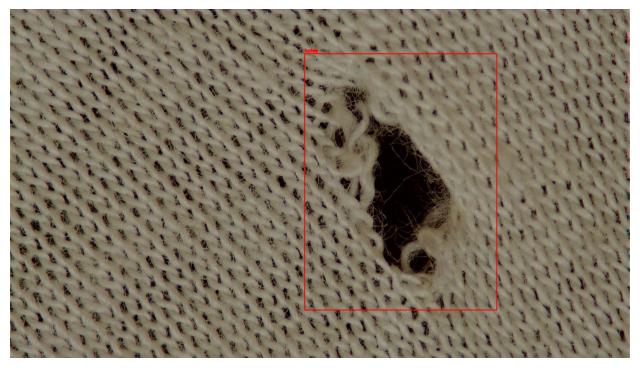

In [ ]:
import cv2
import xml.etree.ElementTree as ET
import os
import matplotlib.pyplot as plt

# Define dataset paths
VOC_ROOT = "/content/drive/MyDrive/VOCdevkit/VOC2007/"
ANNOTATIONS_PATH = os.path.join(VOC_ROOT, "Annotations")
IMAGES_PATH = os.path.join(VOC_ROOT, "JPEGImages")

# List annotation files
xml_files = [f for f in os.listdir(ANNOTATIONS_PATH) if f.endswith(".xml")]

# Load one image and its annotation
xml_file = xml_files[0]  # Change index to visualize a different image
tree = ET.parse(os.path.join(ANNOTATIONS_PATH, xml_file))
root = tree.getroot()

# Get image file name
image_filename = root.find("filename").text
image_path = os.path.join(IMAGES_PATH, image_filename)

# Read image
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Draw bounding boxes
for obj in root.findall("object"):
    bbox = obj.find("bndbox")
    xmin = int(bbox.find("xmin").text)
    ymin = int(bbox.find("ymin").text)
    xmax = int(bbox.find("xmax").text)
    ymax = int(bbox.find("ymax").text)
    label = obj.find("name").text

    # Draw rectangle
    cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (255, 0, 0), 2)
    cv2.putText(image, label, (xmin, ymin - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

# Show the image
plt.figure(figsize=(8, 6))
plt.imshow(image)
plt.axis("off")
plt.show()


In [ ]:
import torch
import pandas as pd
import numpy as np
import os
import cv2
import torchvision.transforms as transforms
from torch.utils.data import Dataset

# Define your dataset class
class FabricDefectDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)  # Load CSV
        self.img_dir = img_dir  # Image folder
        self.transform = transform

    def __len__(self):
        return len(self.annotations['image_id'].unique())  # Unique image count

    def __getitem__(self, index):
        # Get all annotations for this index
        image_id = self.annotations['image_id'].unique()[index]
        img_path = os.path.join(self.img_dir, image_id)

        # Load image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = transforms.ToTensor()(image)  # Convert to PyTorch Tensor

        # Get bounding boxes for this image
        boxes = []
        labels = []
        for _, row in self.annotations[self.annotations['image_id'] == image_id].iterrows():
            x_min, y_min, x_max, y_max = row[['x_min', 'y_min', 'x_max', 'y_max']]
            boxes.append([x_min, y_min, x_max, y_max])
            labels.append(row['label'])  # Class labels

        # Convert to Tensor
        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64)  # Convert labels to integer IDs
        }

        return image, target


In [ ]:
import torch
import pandas as pd
import numpy as np
import os
import cv2
import torchvision.transforms as transforms
from torch.utils.data import Dataset
from torch.utils.data import DataLoader

# Define your dataset class
class FabricDefectDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)  # Load CSV
        # Print the columns to help debug
        print(f"Columns in the CSV file: {self.annotations.columns.tolist()}")

        if 'image_name' not in self.annotations.columns:
            raise KeyError("The CSV file does not contain an 'image_name' column. Please check your CSV and ensure the correct column name is used.")

        self.img_dir = img_dir  # Image folder
        self.transform = transform

    def __len__(self):
        return len(self.annotations['image_name'].unique())  # Unique image count

    def __getitem__(self, index):
        # Get all annotations for this index
        image_id = self.annotations['image_name'].unique()[index]
        img_path = os.path.join(self.img_dir, image_id)

        # Load image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = transforms.ToTensor()(image)  # Convert to PyTorch Tensor

        # Get bounding boxes for this image
        boxes = []
        labels = []
        for _, row in self.annotations[self.annotations['image_name'] == image_id].iterrows():
            x_min, y_min, x_max, y_max = row[['x_min', 'y_min', 'x_max', 'y_max']]
            boxes.append([x_min, y_min, x_max, y_max])
            labels.append(row['label_name'])  # Class labels

        # Convert to Tensor
        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "label_name": torch.tensor(labels, dtype=torch.int64)  # Convert labels to integer IDs
        }

        return image, target


csv_path = "/content/labels_my-project-name_2025-02-25-11-13-58.csv"  # Change to your CSV file
img_folder = "/content/drive/MyDrive/dataset"  # Path to images

# Load dataset
dataset = FabricDefectDataset(csv_file=csv_path, img_dir=img_folder)
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

print("✅ DataLoader is ready!")

Columns in the CSV file: ['label_name', 'bbox_x', 'bbox_y', 'bbox_width', 'bbox_height', 'image_name', 'image_width', 'image_height']
✅ DataLoader is ready!


In [ ]:
import torch
import pandas as pd
import numpy as np
import os
import cv2
import torchvision.transforms as transforms
from torch.utils.data import Dataset

# Define your dataset class
class FabricDefectDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.annotations = pd.read_csv(csv_file)  # Load CSV
        self.img_dir = img_dir  # Image folder
        self.transform = transform

        # Get unique label mappings
        self.label_mapping = {label: i+1 for i, label in enumerate(self.annotations['label_name'].unique())}
        self.label_mapping['background'] = 0  # Background class

    def __len__(self):
        return len(self.annotations['image_name'].unique())  # Unique image count

    def __getitem__(self, index):
        # Get all annotations for this image
        image_name = self.annotations['image_name'].unique()[index]
        img_path = os.path.join(self.img_dir, image_name)

        # Load image
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = transforms.ToTensor()(image)  # Convert to PyTorch Tensor

        # Get bounding boxes and labels
        boxes = []
        labels = []
        for _, row in self.annotations[self.annotations['image_name'] == image_name].iterrows():
            x_min = row['bbox_x']
            y_min = row['bbox_y']
            x_max = x_min + row['bbox_width']
            y_max = y_min + row['bbox_height']

            boxes.append([x_min, y_min, x_max, y_max])
            labels.append(self.label_mapping[row['label_name']])  # Convert label to numeric ID

        # Convert to Tensor
        target = {
            "boxes": torch.tensor(boxes, dtype=torch.float32),
            "labels": torch.tensor(labels, dtype=torch.int64)
        }

        return image, target


In [ ]:
import torch

# Check for GPU, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Using device: {device}")

# Load Faster R-CNN model
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
model.to(device)  # Move model to CPU/GPU

# Modify classifier for your dataset (change num_classes)
num_classes = len(dataset.label_mapping)  # Number of classes (including background)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Define optimizer
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)

# Training loop
for epoch in range(5):  # Train for 5 epochs
    for images, targets in data_loader:
        images = list(img.to(device) for img in images)  # Move images to CPU/GPU
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

        optimizer.zero_grad()
        loss_dict = model(images, targets)  # Forward pass
        loss = sum(loss for loss in loss_dict.values())

        loss.backward()
        optimizer.step()

    print(f"Epoch [{epoch+1}/5], Loss: {loss.item():.4f}")

print("🎉 Training completed!")


✅ Using device: cpu
Epoch [1/5], Loss: 0.1879
Epoch [2/5], Loss: 0.2319
Epoch [3/5], Loss: 0.3031


In [ ]:
import torch
import torchvision.models as models

# Create the Faster R-CNN model
model = models.detection.fasterrcnn_resnet50_fpn(pretrained=True)

# Modify the model for your specific number of classes
num_classes = 2  # Example: 2 classes (defect and no defect)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

# Train the model (example training loop)
# ... your training code here ...

# Save the model after training
torch.save(model.state_dict(), "fabric_defect_detector.pth")
print("✅ Model saved successfully!")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 103MB/s]


✅ Model saved successfully!


In [ ]:
import torch

# Save trained Faster R-CNN model
torch.save(model.state_dict(), "fabric_defect_detector.pth")
print("✅ Model saved successfully!")

NameError: name 'model' is not defined

In [ ]:
# Save trained Faster R-CNN model
torch.save(model.state_dict(), "fabric_defect_detector.pth")
print("✅ Model saved successfully!")


NameError: name 'torch' is not defined

In [ ]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

# Define device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the trained model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")

# Define the number of classes (e.g., 2 for defect and no defect)
num_classes = 2

# Get the number of input features for the box predictor
in_features = model.roi_heads.box_predictor.cls_score.in_features

# Replace the pre-trained box predictor head with a new one for your number of classes
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load trained weights
model.load_state_dict(torch.load("fabric_defect_detector.pth", map_location=device))

# Move the model to the appropriate device (CPU or GPU)
model.to(device)

# Set the model to evaluation mode
model.eval()

print("✅ Model loaded successfully!")

<ipython-input-5-526b34f9a18c>:21: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("fabric_defect_detector.pth", map_location=device))


✅ Model loaded successfully!


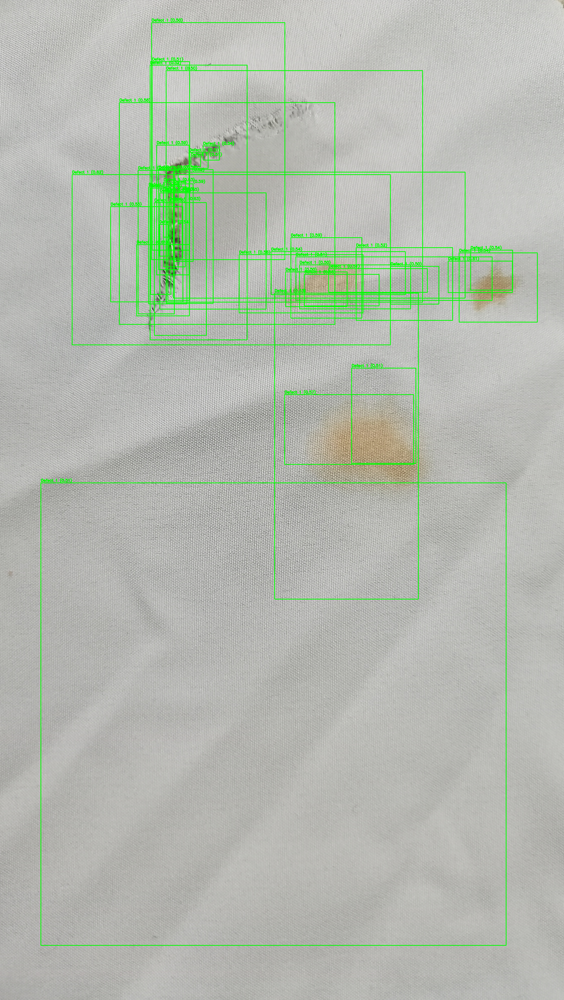

In [ ]:
import cv2
import torch
import torchvision.transforms as T
from PIL import Image
from google.colab.patches import cv2_imshow  # Use cv2_imshow for Colab

# Load image using OpenCV
def load_image(image_path):
    image = Image.open(image_path).convert("RGB")
    transform = T.Compose([T.ToTensor()])  # Convert to tensor
    return transform(image).to(device)

# Perform inference
def detect_defects(image_path, threshold=0.5):
    image = load_image(image_path)
    with torch.no_grad():
        prediction = model([image])  # Model inference

    # Load the image using OpenCV for visualization
    image_cv2 = cv2.imread(image_path)
    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > threshold:
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            # Draw bounding box and label
            cv2.rectangle(image_cv2, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(image_cv2, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Use cv2_imshow instead of cv2.imshow for Colab
    cv2_imshow(image_cv2)

# Test on a new image
detect_defects("/content/test_image.jpg")

In [ ]:
import cv2
import torch
import torchvision.transforms as T
from PIL import Image
from google.colab.patches import cv2_imshow  # Use cv2_imshow for Colab

# Define IP Webcam URL (update with your phone's IP)
IP_WEBCAM_URL = "http://192.168.100.3:8080/video"

# Open Video Stream
cap = cv2.VideoCapture(IP_WEBCAM_URL)

# Check if the video stream is opened successfully
if not cap.isOpened():
    print("⚠️ Failed to open video stream. Check the IP Webcam URL.")
    exit()

# Define image transformation
transform = T.Compose([T.ToTensor()])

# Loop to process video frames
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print("⚠️ Failed to capture video frame")
        break

    # Convert frame to PIL Image
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # Transform image
    image_tensor = transform(image_pil).to(device)

    # Perform defect detection
    with torch.no_grad():
        prediction = model([image_tensor])

    # Draw bounding boxes
    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > 0.5:  # Confidence threshold
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the frame using cv2_imshow
    cv2_imshow(frame)

    # Press 'q' to exit (not applicable in Colab)
    # Use Colab's "Interrupt Execution" button to stop the loop

# Release resources
cap.release()

⚠️ Failed to open video stream. Check the IP Webcam URL.


In [ ]:
!labelImg

QObject::moveToThread: Current thread (0x22a7ab0) is not the object's thread (0x2545140).
Cannot move to target thread (0x22a7ab0)

qt.qpa.plugin: Could not load the Qt platform plugin "xcb" in "/usr/local/lib/python3.11/dist-packages/cv2/qt/plugins" even though it was found.
This application failed to start because no Qt platform plugin could be initialized. Reinstalling the application may fix this problem.

Available platform plugins are: xcb, eglfs, linuxfb, minimal, minimalegl, offscreen, vnc, wayland-egl, wayland, wayland-xcomposite-egl, wayland-xcomposite-glx, webgl.



In [ ]:
import cv2
import torch
import torchvision.transforms as T
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from PIL import Image
import numpy as np

# Check for GPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"✅ Using device: {device}")


✅ Using device: cpu


In [ ]:
import torch
import torchvision
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
# Load Faster R-CNN model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(weights="DEFAULT")
in_features = model.roi_heads.box_predictor.cls_score.in_features
num_classes = 2  # Update based on your dataset (classes + 1 for background)
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)

# Load trained weights
model.load_state_dict(torch.load("/content/fabric_defect_detector.pth", map_location=device))
model.to(device)
model.eval()  # Set model to evaluation mode
print("✅ Model loaded successfully!")


<ipython-input-2-bdc9f4069f7c>:11: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("/content/fabric_defect_detector.pth", map_location=device)

✅ Model loaded successfully!


In [ ]:
import cv2
import torch
import torchvision.transforms as T
from PIL import Image

# Define device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Open video file
video_path = "/content/vid1.mp4"  # Update with your actual video path
cap = cv2.VideoCapture(video_path)

# Check if the video was opened successfully
if not cap.isOpened():
    print("⚠️ Failed to open video file. Check the path.")
    exit()

# Define image transformation
transform = T.Compose([T.ToTensor()])

# Define output video writer
output_path = "/content/revid1.mp4"
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_path, fourcc, fps, (frame_width, frame_height))

# Process video frames
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print("⚠️ Video processing completed.")
        break

    # Convert frame to PIL Image
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # Transform image
    image_tensor = transform(image_pil).to(device)

    # Perform defect detection
    with torch.no_grad():
        prediction = model([image_tensor])

    # Draw bounding boxes
    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > 0.5:  # Confidence threshold
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to output video
    out.write(frame)

# Release resources
cap.release()
out.release()
print(f"✅ Processed video saved as {output_path}")

KeyboardInterrupt: 

In [ ]:
import cv2
import torch
import torchvision.transforms as T
from PIL import Image

# Define device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Open video file
video_path = "/content/video1.mp4"  # Update with your actual video path
cap = cv2.VideoCapture(video_path)

# Check if the video was opened successfully
if not cap.isOpened():
    print("⚠️ Failed to open video file. Check the path.")
    exit()

# Define image transformation
transform = T.Compose([T.ToTensor()])

# Define output video writer
output_path = "/content/revideo1.mp4"
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Reduce frame rate by skipping frames
skip_frames = 6  # Process every 2nd frame
new_fps = fps / skip_frames

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_path, fourcc, new_fps, (frame_width, frame_height))

# Process video frames
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print("⚠️ Video processing completed.")
        break

    # Skip frames
    frame_count += 1
    if frame_count % skip_frames != 0:
        continue

    # Convert frame to PIL Image
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # Transform image
    image_tensor = transform(image_pil).to(device)

    # Perform defect detection
    with torch.no_grad():
        prediction = model([image_tensor])

    # Draw bounding boxes
    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > 0.5:  # Confidence threshold
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to output video
    out.write(frame)

# Release resources
cap.release()
out.release()
print(f"✅ Processed video saved as {output_path}")

⚠️ Video processing completed.
✅ Processed video saved as /content/revideo1.mp4


In [ ]:
from google.colab import files
files.download("/content/revideo1.mp4")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab.patches import cv2_imshow

# Display the first 10 frames (for example)
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_count >= 10:
        break

    # Process frame (same as above)
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    image_tensor = transform(image_pil).to(device)
    with torch.no_grad():
        prediction = model([image_tensor])

    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > 0.5:
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Display the frame
    cv2_imshow(frame)
    frame_count += 1

# Release resources
cap.release()

In [ ]:
import cv2
import torch
import torchvision.transforms as T
from PIL import Image

# Define device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Open video file
video_path = "/content/video2.mp4"  # Update with your actual video path
cap = cv2.VideoCapture(video_path)

# Check if the video was opened successfully
if not cap.isOpened():
    print("⚠️ Failed to open video file. Check the path.")
    exit()

# Define image transformation
transform = T.Compose([T.ToTensor()])

# Define output video writer
output_path = "/content/revideo2.mp4"
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Reduce frame rate by skipping frames
skip_frames = 15  # Process every 2nd frame
new_fps = fps / skip_frames

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_path, fourcc, new_fps, (frame_width, frame_height))

# Process video frames
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print("⚠️ Video processing completed.")
        break

    # Skip frames
    frame_count += 1
    if frame_count % skip_frames != 0:
        continue

    # Convert frame to PIL Image
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # Transform image
    image_tensor = transform(image_pil).to(device)

    # Perform defect detection
    with torch.no_grad():
        prediction = model([image_tensor])

    # Draw bounding boxes
    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > 0.5:  # Confidence threshold
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to output video
    out.write(frame)

# Release resources
cap.release()
out.release()
print(f"✅ Processed video saved as {output_path}")

⚠️ Video processing completed.
✅ Processed video saved as /content/revideo2.mp4


In [ ]:
import cv2
import torch
import torchvision.transforms as T
from PIL import Image

# Define device (CPU or GPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Open video file
video_path = "/content/video3.mp4"  # Update with your actual video path
cap = cv2.VideoCapture(video_path)

# Check if the video was opened successfully
if not cap.isOpened():
    print("⚠️ Failed to open video file. Check the path.")
    exit()

# Define image transformation
transform = T.Compose([T.ToTensor()])

# Define output video writer
output_path = "/content/revideo3.mp4"
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
fps = int(cap.get(cv2.CAP_PROP_FPS))

# Reduce frame rate by skipping frames
skip_frames = 30  # Process every 2nd frame
new_fps = fps / skip_frames

fourcc = cv2.VideoWriter_fourcc(*"mp4v")
out = cv2.VideoWriter(output_path, fourcc, new_fps, (frame_width, frame_height))

# Process video frames
frame_count = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        print("⚠️ Video processing completed.")
        break

    # Skip frames
    frame_count += 1
    if frame_count % skip_frames != 0:
        continue

    # Convert frame to PIL Image
    image_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))

    # Transform image
    image_tensor = transform(image_pil).to(device)

    # Perform defect detection
    with torch.no_grad():
        prediction = model([image_tensor])

    # Draw bounding boxes
    for i in range(len(prediction[0]["boxes"])):
        score = prediction[0]["scores"][i].item()
        if score > 0.5:  # Confidence threshold
            x1, y1, x2, y2 = map(int, prediction[0]["boxes"][i].tolist())
            label = prediction[0]["labels"][i].item()
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"Defect {label} ({score:.2f})", (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Write the frame to output video
    out.write(frame)

# Release resources
cap.release()
out.release()
print(f"✅ Processed video saved as {output_path}")

⚠️ Video processing completed.
✅ Processed video saved as /content/revideo3.mp4
